In [1]:
import findspark
findspark.init()

In [2]:
from pyspark.sql import SparkSession

In [3]:
spark = SparkSession.builder\
    .master('local[*]')\
    .appName('Recomendacao com Spark')\
    .config("spark.driver.bindAddress", "localhost") \
    .config("spark.ui.port", "4050") \
    .config("spark.driver.memory", "4g") \
    .config("spark.driver.host", "localhost") \
    .config("spark.driver.bindAddress", "127.0.0.1") \
    .getOrCreate()

In [4]:
spark

# Leitura dos Dados

In [5]:
from pyspark import SparkFiles

In [6]:
url_dados = 'https://github.com/IgorNascAlves/dados/blob/main/dados_musicas.csv?raw=true'
spark.sparkContext.addFile(url_dados)

In [7]:
path_dados = 'file:///' + SparkFiles.get('dados_musicas.csv')

In [8]:
dados = spark.read.csv(path_dados, header=True, sep=';', inferSchema=True)

In [9]:
dados.limit(6).toPandas()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.002390,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.143000,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.009580,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.006640,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.030200,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady
5,0.941,2000,0.000996,Disturbed,0.695,279213,0.876,1,40rvBMQizxkIqnjPdEWY1v,0.000007,3,0.1060,-4.262,0,Down with the Sickness,76,0.0553,89.954,Disturbed - Down with the Sickness


In [10]:
dados.printSchema()

root
 |-- valence: double (nullable = true)
 |-- year: integer (nullable = true)
 |-- acousticness: double (nullable = true)
 |-- artists: string (nullable = true)
 |-- danceability: double (nullable = true)
 |-- duration_ms: integer (nullable = true)
 |-- energy: double (nullable = true)
 |-- explicit: integer (nullable = true)
 |-- id: string (nullable = true)
 |-- instrumentalness: double (nullable = true)
 |-- key: integer (nullable = true)
 |-- liveness: double (nullable = true)
 |-- loudness: double (nullable = true)
 |-- mode: integer (nullable = true)
 |-- name: string (nullable = true)
 |-- popularity: integer (nullable = true)
 |-- speechiness: double (nullable = true)
 |-- tempo: double (nullable = true)
 |-- artists_song: string (nullable = true)



In [11]:
dados.count()

20311

In [12]:
len(dados.columns)

19

In [13]:
import pyspark.sql.functions as f

#### Verificando se possui valores nulos

In [14]:
dados.select([f.count(f.when(f.isnull(c), 1)).alias(c) for c in dados.columns]).toPandas()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [15]:
sorted(dados.select(dados.year).distinct().collect())

[Row(year=2000),
 Row(year=2001),
 Row(year=2002),
 Row(year=2003),
 Row(year=2004),
 Row(year=2005),
 Row(year=2006),
 Row(year=2007),
 Row(year=2008),
 Row(year=2009),
 Row(year=2010),
 Row(year=2011),
 Row(year=2012),
 Row(year=2013),
 Row(year=2014),
 Row(year=2015),
 Row(year=2016),
 Row(year=2017),
 Row(year=2018),
 Row(year=2019),
 Row(year=2020)]

In [16]:
dados.createOrReplaceTempView('dadosVIEW')

In [17]:
spark.sql("SELECT YEAR, AVG(ENERGY) FROM DADOSVIEW GROUP BY 1 ORDER BY 1 DESC").show()

+----+------------------+
|YEAR|       avg(ENERGY)|
+----+------------------+
|2020|0.6288033043478263|
|2019|0.6140382256297917|
|2018|0.6076108333333327|
|2017|0.5911920206398344|
|2016|0.5927858911111107|
|2015|0.6245570107737527|
|2014|0.6570088241639692|
|2013| 0.657273630831643|
|2012|0.6736088732394369|
|2011|0.6771248416751784|
|2010|0.6926804910292728|
|2009|0.6774364609053491|
|2008|0.6843681777777779|
|2007|0.6930954555084744|
|2006| 0.679125636743215|
|2005|0.6725045425867509|
|2004|0.6593516436903505|
|2003|0.6623830396475766|
|2002|0.6548407696909274|
|2001|0.6381052575107306|
+----+------------------+
only showing top 20 rows



# Leitura de dados por Ano

In [18]:
url_anos_dados = 'https://github.com/IgorNascAlves/dados/blob/main/dados_musicas_ano.csv?raw=true'

In [19]:
spark.sparkContext.addFile(url_anos_dados)

In [20]:
path_dados_files = 'file:///' + SparkFiles.get('dados_musicas_ano.csv')

In [21]:
dados_ano = spark.read.csv(path_dados_files, header=True, inferSchema=True, sep=',')

In [22]:
dados_ano.toPandas()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.205710,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.240720,-19.275282,0.116655,100.884521,0.535549,0.140845,10
2,1,1923,0.957247,0.577341,177942.362162,0.262406,0.371733,0.227462,-14.129211,0.093949,114.010730,0.625492,5.389189,0
3,1,1924,0.940200,0.549894,191046.707627,0.344347,0.581701,0.235219,-14.231343,0.092089,120.689572,0.663725,0.661017,10
4,1,1925,0.962607,0.573863,184986.924460,0.278594,0.418297,0.237668,-14.146414,0.111918,115.521921,0.621929,2.604317,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1,2016,0.284171,0.600202,221396.510295,0.592855,0.093984,0.181170,-8.061056,0.104313,118.652630,0.431532,59.647190,0
96,1,2017,0.286099,0.612217,211115.696787,0.590421,0.097091,0.191713,-8.312630,0.110536,117.202740,0.416476,63.263554,1
97,1,2018,0.267633,0.663500,206001.007133,0.602435,0.054217,0.176326,-7.168785,0.127176,121.922308,0.447921,63.296243,1
98,1,2019,0.278299,0.644814,201024.788096,0.593224,0.077640,0.172616,-7.722192,0.121043,120.235644,0.458818,65.256542,1


In [23]:
dados_ano = dados_ano.filter('year >= 2000')

In [24]:
dados_ano.toPandas()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049,7
1,1,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125,7
2,1,2002,0.282624,0.576160,239503.283000,0.641270,0.088048,0.193911,-7.686640,0.084308,119.239738,0.542397,48.655500,7
3,1,2003,0.256471,0.575763,244670.575230,0.660165,0.083049,0.196976,-7.485545,0.093926,120.914622,0.530504,48.626407,7
4,1,2004,0.280559,0.567680,237378.708037,0.648868,0.077934,0.202199,-7.601655,0.094239,121.290346,0.524489,49.273143,7
5,1,2005,0.255764,0.572281,237229.588205,0.653209,0.090194,0.190082,-7.466159,0.093334,121.617967,0.532531,50.953333,0
6,1,2006,0.279986,0.568230,234042.914359,0.650326,0.077701,0.188289,-7.265501,0.085847,121.798615,0.520028,51.313846,7
7,1,2007,0.254081,0.563414,241049.962564,0.668305,0.072957,0.196127,-7.044536,0.084347,124.087516,0.516794,51.075897,7
8,1,2008,0.249192,0.579193,240107.315601,0.671461,0.063662,0.198431,-6.843804,0.077356,123.509934,0.527542,50.630179,0
9,1,2009,0.261929,0.564190,238140.013265,0.670749,0.075872,0.205252,-7.046015,0.085458,123.463808,0.507170,51.440816,0


In [25]:
dados_ano.count()

21

In [26]:
len(dados_ano.columns)

14

# Analisando Dados

### Plotamento de gráfico para visualizar cada dados de uma coluna

In [27]:
import plotly.express as px

In [28]:
fig = px.line(dados_ano.toPandas(), x='year', y= 'loudness', markers=True, title='Variação do loudness conforme os anos')

In [29]:
fig.show()

In [30]:
import plotly.graph_objects as go

In [31]:
fig = go.Figure()

In [32]:
temp = dados_ano.toPandas()

In [33]:
fig.add_trace(go.Scatter(x=temp['year'], y=temp['acousticness'], name='Acousticness'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['valence'], name='Valence'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['danceability'], name='Danceability'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['energy'], name='Energy'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['instrumentalness'], name='Instrumentalness'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['liveness'], name='Liveness'))
fig.add_trace(go.Scatter(x=temp['year'], y=temp['speechiness'], name='Speechiness'))

# Matriz de correlação

In [34]:
fig = px.imshow(dados_ano.drop('mode').toPandas().corr(), text_auto=True)
fig.show()

# Leitura de dados de gêneros musicais

In [35]:
url_dados_generos = 'https://github.com/IgorNascAlves/dados/blob/main/dados_musicas_genero.csv?raw=true'

In [36]:
spark.sparkContext.addFile(url_dados_generos)

In [37]:
path_dados_file = "file:///" + SparkFiles.get("dados_musicas_genero.csv")

In [38]:
dados_generos = spark.read.csv(path_dados_file, header=True, inferSchema=True)

In [39]:
dados_generos.toPandas()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2968,1,zolo,0.222625,0.547082,2.580991e+05,0.610240,0.143872,0.204206,-11.295878,0.061088,125.494919,0.596155,33.778943,9
2969,0,zouglou,0.161000,0.863000,2.063200e+05,0.909000,0.000000,0.108000,-5.985000,0.081300,119.038000,0.845000,58.000000,7
2970,1,zouk,0.263261,0.748889,3.060728e+05,0.622444,0.257227,0.089678,-10.289222,0.038778,101.965222,0.824111,46.666667,5
2971,0,zurich indie,0.993000,0.705667,1.984173e+05,0.172667,0.468633,0.179667,-11.453333,0.348667,91.278000,0.739000,0.000000,7


In [40]:
dados_generos.count()

2973

In [41]:
dados_generos.select('genres').distinct().count()

2973

In [42]:
len(dados_generos.columns)

14

#### StandartScale

###### StandartScale é usado para padronizar os recursos em um conjunto de dados, removendo a média e escalonando para a variância unitária

In [43]:
from pyspark.ml.feature import VectorAssembler

In [44]:
dados_generos.columns

['mode',
 'genres',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'instrumentalness',
 'liveness',
 'loudness',
 'speechiness',
 'tempo',
 'valence',
 'popularity',
 'key']

In [45]:
X = dados_generos.columns

In [46]:
X.remove('genres')

In [47]:
X

['mode',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'instrumentalness',
 'liveness',
 'loudness',
 'speechiness',
 'tempo',
 'valence',
 'popularity',
 'key']

In [48]:
dados_generos_vector = VectorAssembler(inputCols=X, outputCol='features').transform(dados_generos)\
.select(['features', 'genres'])

In [49]:
dados_generos_vector.show(truncate=100)

+----------------------------------------------------------------------------------------------------+----------------------+
|                                                                                            features|                genres|
+----------------------------------------------------------------------------------------------------+----------------------+
|[1.0,0.9793333333333332,0.16288333333333335,160297.66666666663,0.07131666666666665,0.60683367,0.3...|21st century classical|
|[1.0,0.49478,0.2993333333333333,1048887.333333333,0.4506783333333333,0.4777616666666668,0.131,-16...|                 432hz|
|[1.0,0.762,0.7120000000000001,115177.0,0.818,0.8759999999999999,0.126,-9.18,0.047,133.444,0.975,4...|                 8-bit|
|[1.0,0.6514170195595453,0.5290925603549332,232880.8902503945,0.4191460727353524,0.205309189511136...|                    []|
|[1.0,0.676557304985755,0.5389612464387464,190628.5408867521,0.3164335701566952,0.0030034414404202...|            a ca

In [50]:
from pyspark.ml.feature import StandardScaler

In [51]:
scale = StandardScaler(inputCol='features', outputCol='scaled_features')
scaler_model = scale.fit(dados_generos_vector)
dados_generos_scaler = scaler_model.transform(dados_generos_vector)

In [52]:
dados_generos_scaler.show(truncate=50)

+--------------------------------------------------+----------------------+--------------------------------------------------+
|                                          features|                genres|                                   scaled_features|
+--------------------------------------------------+----------------------+--------------------------------------------------+
|[1.0,0.9793333333333332,0.16288333333333335,160...|21st century classical|[2.6817483100027903,3.06270998538775,1.08107654...|
|[1.0,0.49478,0.2993333333333333,1048887.3333333...|                 432hz|[2.6817483100027903,1.5473461333255456,1.986711...|
|[1.0,0.762,0.7120000000000001,115177.0,0.818,0....|                 8-bit|[2.6817483100027903,2.3830343861798493,4.725630...|
|[1.0,0.6514170195595453,0.5290925603549332,2328...|                    []|[2.6817483100027903,2.0372036185737374,3.511651...|
|[1.0,0.676557304985755,0.5389612464387464,19062...|            a cappella|[2.6817483100027903,2.11582588189267

## PCA - Principal Componentes Analysis

###### reunir as diversas features e reduzi-las em apenas duas, permitindo, desta maneira, a construção de análises gráficas e um estudo mais apurado das informações.

In [53]:
from pyspark.ml.feature import PCA

In [54]:
pca = PCA(k=2, inputCol='scaled_features', outputCol='pca_features')
model_pca = pca.fit(dados_generos_scaler)
dados_generos_pca = model_pca.transform(dados_generos_scaler)

In [55]:
dados_generos_pca.select('pca_features').show(truncate = False)

+------------------------------------------+
|pca_features                              |
+------------------------------------------+
|[2.507095366888567,0.43816913737697955]   |
|[-0.5969679056633486,4.981612052751347]   |
|[-4.158460276223561,-0.8366525081079937]  |
|[-2.387344878512217,-0.4877989015663406]  |
|[-2.6501218371679083,-0.5756819768820469] |
|[-1.4965091203367624,1.8644183183717793]  |
|[-3.9235207721573238,0.2851835002352834]  |
|[-4.611011109831115,-0.6783790472312372]  |
|[-2.8376900630842297,-0.5712993716580518] |
|[-2.706690139892783,-1.2593788079708297]  |
|[-4.698331383924287,1.276556968061945]    |
|[-3.3759874966798677,0.756074106430747]   |
|[-5.608998877066021,1.0427311644393216]   |
|[0.29549463521176883,-0.27638645862363015]|
|[-2.5725591062870423,-1.3169815431109795] |
|[-3.400822802049345,0.5073029625781902]   |
|[-4.366720316263418,-0.33648270597710866] |
|[-2.7254698167724003,0.5058604987046368]  |
|[-4.958112358381606,1.2627579957290729]   |
|[-3.69349

## Pipeline

######  Antes de partimos para a criação desses agrupamentos, todo o pipeline que criamos, isto é, todas as etapas, acabaram por deixar o processo um pouco complexo como um todo. Existem diversos detalhes que precisamos fazer antes de pegarmos os dados e aplicarmos nesse clustering. Vamos salvar todo o conhecimento desenvolvido na geração do pipeline e, para isso, podemos usar uma ferramenta de mesmo nome, "pipeline". Então, vamos criar um pipeline que guardará toda essa estratégia de transformação de dados em um objeto só. Precisamos importar o Pipeline.                                                                                  PCA é um método clássico que podemos usar para reduzir dados de alta dimensionalidade para um espaço de baixa dimensão. Em outras palavras, não podemos visualizar com precisão conjuntos de dados de alta dimensão porque não é possível observar nada acima de 3 dimensões (3D). Um dos principais objetivos do PCA é transformar conjuntos de dados com mais de 3 dimensões (alta dimensão) em gráficos tipicamente 2D ou 3D para nós e isso é o que chamamos de espaço de baixa dimensão.

In [56]:
from pyspark.ml import Pipeline

In [57]:
pca_pipeline = Pipeline(stages=[VectorAssembler(inputCols=X, outputCol='features'),
                                StandardScaler(inputCol='features', outputCol='scaled_features'),
                                PCA(k=2, inputCol='scaled_features', outputCol='pca_features')])

In [58]:
pca_pipeline_model = pca_pipeline.fit(dados_generos)

In [59]:
dados_generos_pca = pca_pipeline_model.transform(dados_generos)

In [60]:
dados_generos_pca.toPandas()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,features,scaled_features,pca_features
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6,"[1.0, 0.9793333333333332, 0.16288333333333335,...","[2.6817483100027903, 3.06270998538775, 1.08107...","[2.507095366888567, 0.43816913737697955]"
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5,"[1.0, 0.49478, 0.2993333333333333, 1048887.333...","[2.6817483100027903, 1.5473461333255456, 1.986...","[-0.5969679056633486, 4.981612052751347]"
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7,"[1.0, 0.762, 0.7120000000000001, 115177.0, 0.8...","[2.6817483100027903, 2.3830343861798493, 4.725...","[-4.158460276223561, -0.8366525081079937]"
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7,"[1.0, 0.6514170195595453, 0.5290925603549332, ...","[2.6817483100027903, 2.0372036185737374, 3.511...","[-2.387344878512217, -0.4877989015663406]"
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7,"[1.0, 0.676557304985755, 0.5389612464387464, 1...","[2.6817483100027903, 2.1158258818926794, 3.577...","[-2.6501218371679083, -0.5756819768820469]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2968,1,zolo,0.222625,0.547082,2.580991e+05,0.610240,0.143872,0.204206,-11.295878,0.061088,125.494919,0.596155,33.778943,9,"[1.0, 0.22262496820571934, 0.547081530483321, ...","[2.6817483100027903, 0.6962243496803475, 3.631...","[-3.9181421935898797, 0.41650701837244286]"
2969,0,zouglou,0.161000,0.863000,2.063200e+05,0.909000,0.000000,0.108000,-5.985000,0.081300,119.038000,0.845000,58.000000,7,"[0.0, 0.161, 0.863, 206320.0, 0.909, 0.0, 0.10...","[0.0, 0.5035020159776322, 5.727836235891636, 2...","[-6.549271970898396, -0.668292822368372]"
2970,1,zouk,0.263261,0.748889,3.060728e+05,0.622444,0.257227,0.089678,-10.289222,0.038778,101.965222,0.824111,46.666667,5,"[1.0, 0.2632611111111112, 0.7488888888888888, ...","[2.6817483100027903, 0.8233074544904095, 4.970...","[-4.192043469635213, -0.6687762062702762]"
2971,0,zurich indie,0.993000,0.705667,1.984173e+05,0.172667,0.468633,0.179667,-11.453333,0.348667,91.278000,0.739000,0.000000,7,"[0.0, 0.993, 0.7056666666666666, 198417.333333...","[0.0, 3.1054503221477563, 4.683595717026879, 2...","[-1.7680020287988045, -2.969740528792513]"


In [61]:
dados_generos_pca.select('pca_features').show(truncate = False)

+------------------------------------------+
|pca_features                              |
+------------------------------------------+
|[2.507095366888567,0.43816913737697955]   |
|[-0.5969679056633486,4.981612052751347]   |
|[-4.158460276223561,-0.8366525081079937]  |
|[-2.387344878512217,-0.4877989015663406]  |
|[-2.6501218371679083,-0.5756819768820469] |
|[-1.4965091203367624,1.8644183183717793]  |
|[-3.9235207721573238,0.2851835002352834]  |
|[-4.611011109831115,-0.6783790472312372]  |
|[-2.8376900630842297,-0.5712993716580518] |
|[-2.706690139892783,-1.2593788079708297]  |
|[-4.698331383924287,1.276556968061945]    |
|[-3.3759874966798677,0.756074106430747]   |
|[-5.608998877066021,1.0427311644393216]   |
|[0.29549463521176883,-0.27638645862363015]|
|[-2.5725591062870423,-1.3169815431109795] |
|[-3.400822802049345,0.5073029625781902]   |
|[-4.366720316263418,-0.33648270597710866] |
|[-2.7254698167724003,0.5058604987046368]  |
|[-4.958112358381606,1.2627579957290729]   |
|[-3.69349

## K-MEANS

###### K-means tenta encontrar k centróides que representam o centro de cada cluster. Cada ponto do conjunto de dados é atribuído ao centróide mais próximo e os centróides são recalculados como a média dos pontos atribuídos a eles. Esse processo é repetido até que os centróides não mudem mais ou até que um número máximo de iterações seja atingido.

In [62]:
from pyspark.ml.clustering import KMeans

In [63]:
SEED = 1224

In [64]:
kmeans = KMeans(featuresCol='pca_features', predictionCol='cluster_pca').setK(5).setSeed(SEED)

In [65]:
model_kmeans = kmeans.fit(dados_generos_pca)

In [66]:
predictions_kmeans = model_kmeans.transform(dados_generos_pca)

In [67]:
predictions_kmeans.select('pca_features', 'cluster_pca').show(truncate=False)

+------------------------------------------+-----------+
|pca_features                              |cluster_pca|
+------------------------------------------+-----------+
|[2.507095366888567,0.43816913737697955]   |2          |
|[-0.5969679056633486,4.981612052751347]   |2          |
|[-4.158460276223561,-0.8366525081079937]  |4          |
|[-2.387344878512217,-0.4877989015663406]  |0          |
|[-2.6501218371679083,-0.5756819768820469] |0          |
|[-1.4965091203367624,1.8644183183717793]  |2          |
|[-3.9235207721573238,0.2851835002352834]  |4          |
|[-4.611011109831115,-0.6783790472312372]  |1          |
|[-2.8376900630842297,-0.5712993716580518] |4          |
|[-2.706690139892783,-1.2593788079708297]  |0          |
|[-4.698331383924287,1.276556968061945]    |3          |
|[-3.3759874966798677,0.756074106430747]   |4          |
|[-5.608998877066021,1.0427311644393216]   |1          |
|[0.29549463521176883,-0.27638645862363015]|2          |
|[-2.5725591062870423,-1.316981

## Plotando o clustering

In [68]:
from pyspark.ml.functions import vector_to_array

In [69]:
pca_features_xy = predictions_kmeans.withColumn('x', vector_to_array('pca_features')[0])\
                  .withColumn('y', vector_to_array('pca_features')[1])\
                  .select('x', 'y', 'cluster_pca', 'genres')

In [70]:
pca_features_xy.show()

+-------------------+--------------------+-----------+--------------------+
|                  x|                   y|cluster_pca|              genres|
+-------------------+--------------------+-----------+--------------------+
|  2.507095366888567| 0.43816913737697955|          2|21st century clas...|
|-0.5969679056633486|   4.981612052751347|          2|               432hz|
| -4.158460276223561| -0.8366525081079937|          4|               8-bit|
| -2.387344878512217| -0.4877989015663406|          0|                  []|
|-2.6501218371679083| -0.5756819768820469|          0|          a cappella|
|-1.4965091203367624|  1.8644183183717793|          2|            abstract|
|-3.9235207721573238|  0.2851835002352834|          4|      abstract beats|
| -4.611011109831115| -0.6783790472312372|          1|    abstract hip hop|
|-2.8376900630842297| -0.5712993716580518|          4|           accordeon|
| -2.706690139892783| -1.2593788079708297|          0|           accordion|
| -4.6983313

In [71]:
fig = px.scatter(pca_features_xy.toPandas(), x='x', y='y', color='cluster_pca', hover_data=['x', 'y', 'genres'])

In [72]:
fig.show()

###### Na figure mostra que os clusters que ficou muito próximo uma da outra e não obtendo um bom resultado, Isso pode estar relacionado com a quantidade de clusters que selecionamos, talvez precisássemos de menos clusters para representarmos esses pontos, mas isso é um tanto intuitivo, já que tínhamos dois mil e duzentos gêneros musicais, a tendência é que precisássemos de mais clusters. O fato de termos um agrupamento pouco satisfatório pode estar ligado a outro fator: a quantidade de componentes que selecionamos no PCA. Embora dois fosse o ideal para fazermos o plot e visualizarmos o resultado, talvez não seja o ideal para representarmos as 13 componentes originais. Nesta passagem de 13 para 2, talvez tenhamos perdido muitas informações.

In [73]:
pca_pipeline_model.stages

[VectorAssembler_8ed3f1919bb5,
 StandardScalerModel: uid=StandardScaler_ffd0021d71d9, numFeatures=13, withMean=false, withStd=true,
 PCAModel: uid=PCA_439e3732d019, k=2]

In [74]:
# Na definição da função vamos incluir os parâmetros que gostariamos de variar, como quantidade componentes, número de clusters e colunas utilizadas
def cria_pipeline(k_PCA=2, SEED=1224, k_kmeans=5, columns=X, data=dados_generos):


  # Definição do Pipeline
  # Primeiro a vetorização das colunas selecionadas
  # Segundo a padronização dos dados com o StandardScaler
  # Terceiro o PCA com o número k_PCA de componentes
  # Quarto o KMeans com o número k_kmeans de clusters
  pca_pipeline = Pipeline(stages=[VectorAssembler(inputCols = columns, outputCol = 'features'),\
                                StandardScaler(inputCol='features', outputCol='scaled_features'),\
                                PCA(k=k_PCA, inputCol="scaled_features", outputCol='pca_features'),\
                                KMeans(featuresCol='pca_features', predictionCol='cluster_pca', seed=SEED, k=k_kmeans)])

  # ajuste da pipeline com os dados
  model = pca_pipeline.fit(data)

  # transformação dos dados utilizando o modelo da pipeline
  predictions_kmeans = model.transform(data)

  # criando duas novas colunas a partir das primeiras duas componentes do PCA
  pca_features_xs = predictions_kmeans.withColumn("x", vector_to_array("pca_features")[0])\
                   .withColumn("y", vector_to_array("pca_features")[1])\
                   .select(['x', 'y', 'cluster_pca', 'genres'])

  # plotando as duas componentes e o cluster
  fig = px.scatter(
   pca_features_xs.toPandas(), x='x', y='y', color='cluster_pca', hover_data=['x', 'y', 'genres'])
  fig.show()

  # retornando pipeline ajustado
  return model

# Clusterização por Música

## Redução de Dimensionalidade PCA

In [75]:
dados.toPandas()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,0.187,2020,0.57400,Bazzi,0.445,176250,0.330,0,0PUkanqCGTb6qseXPKOw1F,0.000000,9,0.1020,-8.121,1,I Don't Think I'm Okay,69,0.0429,128.025,Bazzi - I Don't Think I'm Okay
20307,0.240,2020,0.81500,Bryson Tiller,0.467,179188,0.429,0,6Iw6fQVKZi0fWtEQBrTFcP,0.000052,6,0.1770,-8.689,0,Timeless Interlude,65,0.0964,148.530,Bryson Tiller - Timeless Interlude
20308,0.466,2020,0.31000,Fleet Foxes,0.562,253613,0.686,0,308prODCCD0O660tIktbUi,0.022500,7,0.1250,-8.480,1,Sunblind,66,0.0249,103.054,Fleet Foxes - Sunblind
20309,0.522,2020,0.20400,Gunna,0.598,230600,0.472,1,2f8y4CuG57UJEmkG3ujd0D,0.000015,0,0.1080,-10.991,1,NASTY GIRL / ON CAMERA,66,0.2580,120.080,Gunna - NASTY GIRL / ON CAMERA


In [76]:
X = dados.columns

In [77]:
# Removendo colunas que não são do nosso interesse
X.remove('artists')
X.remove('id')
X.remove('name')
X.remove('artists_song')

In [78]:
X

['valence',
 'year',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'explicit',
 'instrumentalness',
 'key',
 'liveness',
 'loudness',
 'mode',
 'popularity',
 'speechiness',
 'tempo']

In [79]:
dados_enconded_vector = VectorAssembler(inputCols=X, outputCol='features').transform(dados)

In [80]:
dados_enconded_vector.select('features').show(truncate= False)

+-------------------------------------------------------------------------------------------------------------------------+
|features                                                                                                                 |
+-------------------------------------------------------------------------------------------------------------------------+
|[0.285,2000.0,0.00239,0.429,266773.0,0.6609999999999999,0.0,1.21E-4,11.0,0.234,-7.227,1.0,84.0,0.0281,173.372]           |
|[0.613,2000.0,0.143,0.843,270507.0,0.8059999999999999,1.0,0.0,4.0,0.0771,-5.9460000000000015,0.0,80.0,0.269,94.948]      |
|[0.4,2000.0,0.00958,0.556,216880.0,0.8640000000000001,0.0,0.0,3.0,0.209,-5.87,0.0,84.0,0.0584,105.143]                   |
|[0.5429999999999999,2000.0,0.00664,0.545,233933.0,0.865,0.0,1.1E-5,11.0,0.168,-5.7079999999999975,0.0,78.0,0.0286,99.009]|
|[0.76,2000.0,0.0302,0.949,284200.0,0.6609999999999999,1.0,0.0,5.0,0.0454,-4.244,0.0,80.0,0.0572,104.504]                 |
|[0.941,

###### Temos todas as features reduzidas em um vetor. Já vetorizamos e o nosso próximo passo, antes do PCA, é fazer o StandardScaler(). Vamos ajustar a escala dos nossos dados para obtermos um bom resultado no PCA.

In [81]:
scaler = StandardScaler(inputCol='features', outputCol='features_scaled')
model_scaler = scaler.fit(dados_enconded_vector)
dados_musicas_scaler = model_scaler.transform(dados_enconded_vector)

In [82]:
dados_musicas_scaler.select('features_scaled').toPandas()

,features_scaled
0,"[1.156596679221045, 329.8170613984441, 0.00840..."
1,"[2.4876974188157917, 329.8170613984441, 0.5027..."
2,"[1.6232935848716423, 329.8170613984441, 0.0336..."
3,"[2.203621041463254, 329.8170613984441, 0.02334..."
4,"[3.0842578112561205, 329.8170613984441, 0.1061..."
...,...
20306,"[0.7588897509274928, 333.1152320124285, 2.0181..."
20307,"[0.9739761509229853, 333.1152320124285, 2.8655..."
20308,"[1.8911370263754634, 333.1152320124285, 1.0899..."
20309,"[2.118398128257493, 333.1152320124285, 0.71725..."


In [83]:
k = len(X) 

In [84]:
k

15

In [85]:
pca = PCA(k=k, inputCol='features_scaled', outputCol='pca_features')
model_pca = pca.fit(dados_musicas_scaler)
dados_musicais_pca = model_pca.transform(dados_musicas_scaler)

###### Com isso, ele se ajustará e criará as nossas componentes, mas, nós temos interesse nelas agora? Não! Na verdade, queremos entender o .explainedVariance, isto é, quanto nossas componentes estão explicando. Então, escreveremos model_pca.explainedVariance. Ele retornará uma lista, isto é, um vetor denso que contém nossas 15 componentes e dizendo a explained variance de cada uma delas.

###### Para visualizarmos, no total, quanto elas estão explicando, podemos fazer sum(model_pca.explainedVariance) e multiplicar por 100.

In [86]:
sum(model_pca.explainedVariance) * 100

99.99999999999999

In [87]:
lista_valores = [sum(model_pca.explainedVariance[0:i+1]) for i in range(k)]

In [88]:
lista_valores

[0.21297354127107343,
 0.34597741622955064,
 0.43989805678254446,
 0.5267820578269102,
 0.6001038103117928,
 0.6665719513652388,
 0.7282174213581727,
 0.7845103843321022,
 0.8350002357002613,
 0.8812446547406768,
 0.9151737562703046,
 0.9435370133056037,
 0.9699018569070159,
 0.9900947792885578,
 0.9999999999999999]

In [89]:
import numpy as np

In [90]:
k = sum(np.array(lista_valores) <= 0.7)

In [91]:
k

6

In [92]:
pca = PCA(k=int(k), inputCol='features_scaled', outputCol='pca_features')
model_pca = pca.fit(dados_musicas_scaler)
dados_musicas_pca_final = model_pca.transform(dados_musicas_scaler)

In [93]:
dados_musicas_pca_final.select('pca_features').show(truncate= False, n=5)

+-----------------------------------------------------------------------------------------------------------------------+
|pca_features                                                                                                           |
+-----------------------------------------------------------------------------------------------------------------------+
|[-34.71004464775704,-165.36848784906184,-11.163498729833321,-139.11374280854437,-14.152192300931375,6.254422223810391] |
|[-36.498857627749054,-167.85185045616558,-10.729023248907561,-135.90435265671297,-13.388401890587229,3.972980727830862]|
|[-35.460300916940554,-165.99633344577887,-11.361290348241594,-138.24276881247,-13.866654919305782,4.342675920458719]   |
|[-35.56301325520583,-165.59515096480607,-11.46022600703138,-137.52095740570041,-15.56854280392272,4.542073725584272]   |
|[-36.54556974907567,-167.37512505802482,-11.881276527236556,-136.2779859024398,-14.056847990344538,3.5833901457791564] |
+-----------------------

In [94]:
sum(model_pca.explainedVariance) * 100

66.65719513652388

###### O método explainedVariance nos fornece uma lista com os percentuais de explicação de cada componente e a soma dos elementos dessa lista é o quanto está sendo explicado da variação do conjunto de dados. Por exemplo, ao somar a lista retornada no enunciado da questão, obtemos 0.5268 (ou 52.68%). Se fosse necessário uma explicação maior, teríamos que adicionar mais componentes.

In [95]:
pca_pipeline = Pipeline(stages=[VectorAssembler(inputCols=X, outputCol='features'),
                                StandardScaler(inputCol='features', outputCol='features_scaled'),
                                PCA(k=6, inputCol='features_scaled', outputCol='pca_features')])

In [96]:
model_pca_pipeline = pca_pipeline.fit(dados)

In [97]:
projection = model_pca_pipeline.transform(dados)

In [98]:
projection.select('pca_features').show(truncate= False)

+-----------------------------------------------------------------------------------------------------------------------+
|pca_features                                                                                                           |
+-----------------------------------------------------------------------------------------------------------------------+
|[-34.71004464775704,-165.36848784906184,-11.163498729833321,-139.11374280854437,-14.152192300931375,6.254422223810391] |
|[-36.498857627749054,-167.85185045616558,-10.729023248907561,-135.90435265671297,-13.388401890587229,3.972980727830862]|
|[-35.460300916940554,-165.99633344577887,-11.361290348241594,-138.24276881247,-13.866654919305782,4.342675920458719]   |
|[-35.56301325520583,-165.59515096480607,-11.46022600703138,-137.52095740570041,-15.56854280392272,4.542073725584272]   |
|[-36.54556974907567,-167.37512505802482,-11.881276527236556,-136.2779859024398,-14.056847990344538,3.5833901457791564] |
|[-36.71322229026232,-16

In [99]:
kmeans = KMeans(k=50, featuresCol='pca_features', predictionCol='cluster_pca', seed=SEED)

In [100]:
modelo_kmeans = kmeans.fit(projection)

In [101]:
projetion_kmeans = modelo_kmeans.transform(projection) 

In [102]:
projetion_kmeans.select(['pca_features', 'cluster_pca']).show()

+--------------------+-----------+
|        pca_features|cluster_pca|
+--------------------+-----------+
|[-34.710044647757...|          8|
|[-36.498857627749...|          4|
|[-35.460300916940...|         35|
|[-35.563013255205...|         16|
|[-36.545569749075...|         34|
|[-36.713222290262...|         34|
|[-36.013246178822...|         34|
|[-36.542687712104...|         23|
|[-36.425249009784...|         16|
|[-35.872074915770...|         34|
|[-31.639065936568...|         44|
|[-35.661446890546...|         34|
|[-35.574542234850...|         32|
|[-36.022399748656...|         13|
|[-34.336941950985...|         35|
|[-35.096906055142...|         49|
|[-35.202423054032...|         38|
|[-34.942948671026...|         30|
|[-36.617404517517...|          4|
|[-34.296973387410...|          6|
+--------------------+-----------+
only showing top 20 rows



######  Podemos extrair duas das seis componentes, plotar um gráfico e analisar se os clusters estão ficando bons ou não. Para essa extração, utilizaremos o vector_to_array(). Nossas componentes estão em um array e o nosso objetivo é que eles voltem a ser colunas. Então, nosso projetion_kmeans será igual a projetion_kmeans e nós faremos uma coluna nova, .withColumn(). Nos parênteses, informaremos que desejamos uma coluna x, composta pelos dados do vector_to_array(). Para ele, nós passaremos a coluna onde esses dados estão, pca_features. Nós queremos o primeiro valor da lista de valores do pca_features, por isso adicionaremos [0].

In [103]:
projetion_kmeans = projetion_kmeans.withColumn('x', vector_to_array('pca_features')[0])\
                                    .withColumn('y', vector_to_array('pca_features')[1])

In [104]:
projetion_kmeans.select('x', 'y', 'cluster_pca', 'artists_song').show()

+-------------------+-------------------+-----------+--------------------+
|                  x|                  y|cluster_pca|        artists_song|
+-------------------+-------------------+-----------+--------------------+
| -34.71004464775704|-165.36848784906184|          8|   Coldplay - Yellow|
|-36.498857627749054|-167.85185045616558|          4|OutKast - Ms. Jac...|
|-35.460300916940554|-165.99633344577887|         35|Linkin Park - In ...|
| -35.56301325520583|-165.59515096480607|         16|3 Doors Down - Kr...|
| -36.54556974907567|-167.37512505802482|         34|Eminem - The Real...|
| -36.71322229026232|-166.48208483099708|         34|Disturbed - Down ...|
|-36.013246178822214|-166.63514920955345|         34| Nelly - Ride Wit Me|
|  -36.5426877121049|-166.97928234833242|         23|       Eminem - Stan|
| -36.42524900978431|-165.10535006330758|         16|*NSYNC - Bye Bye Bye|
| -35.87207491577073|-166.03098838247917|         34|Britney Spears - ...|
|-31.639065936568755|  -1

###### O objetivo do Pipeline é tornar o processo de transformação dos dados, que precisa ser executado na ordem correta, mais automático e de mais fácil entendimento. Mas antes, precisamos compreender dois conceitos:

###### Estimador: é qualquer objeto que tem a capacidade de prever alguns parâmetros com base em um conjunto de dados. O estimador realiza essa previsão se ajustando aos dados por meio do método .fit(). Logo, todo estimador deve possuir esse método. Nesse link você pode consultar os estimadores.

###### Transformador: são estimadores que realizam transformação em um conjunto de dados. Nos transformadores, o método .fit() aprende os parâmetros como média e desvio padrão, que serão usados na normalização pelo método .transform(), fazendo a transformação nos dados. Nesse link você encontra os transformadores.

###### Quando consultamos a documentação do Pipeline nos é passado que os passos devem ser uma lista com os objetos de transformadores e estimadores. Resumidamente, no pipeline estão todos os passos da transformação que você quer realizar nos dados sendo, por último, o uso de um estimador para se adaptar aos dados e possibilitar a realização de previsões.

In [105]:
fig = px.scatter(projetion_kmeans.toPandas(), x='x', y='y', color='cluster_pca', hover_data=['artists_song'])
fig.show()

###### No eixo y, temos a componente y e no eixo x, a componente x. Na imagem aparecem diversos pontos que representam as nossas músicas e coloridos, conforme os clusters que representam.

###### Diferentemente da última imagem que construímos, quando fizemos um cluster para os gêneros musicais e tínhamos esses gêneros bem definidos, por exemplo, a cor azul estava toda concentrada em um canto e a amarela em outro, neste gráfico, temos um cenário pior: diversos pontos com cores diferentes, um em cima do outro.

###### O amarelo, neste caso, não está concentrado em um lugar só, mas em todas as áreas, assim como o azul e todas as outras cores de cluster. Isso nos leva a pensar que talvez o nosso cluster não seja muito bom. Será que erramos na quantidade de componentes ou de clusters?

###### Apenas com a análise gráfica, não conseguimos definir isso, porque quando construímos o cluster, utilizamos as seis componentes para a seleção, isto é, calcular os centroides, e estamos exibindo apenas duas componentes no gráfico. Sendo assim, a análise gráfica não é suficiente para sabermos se o nosso resultado foi satisfatório ou não.

## Função para plotar

In [106]:
def plot_cluster(k):
    kmeans = KMeans(k=int(k), featuresCol='pca_features', predictionCol='cluster_pca', seed=SEED)
    modelo_kmeans = kmeans.fit(projection)
    projection_kmeans = modelo_kmeans.transform(projection)
    
    projection_kmeans = projection_kmeans.withColumn('x', vector_to_array('pca_features')[0])\
                                         .withColumn('y', vector_to_array('pca_features')[1])
    
    fig = px.scatter(projection_kmeans.toPandas(), x='x', y='y', color='cluster_pca', hover_data=['artists_song'])
    
    return fig.show()

# Distância Euclidiana

###### A distância euclidiana é uma medida de distância entre dois pontos em um espaço euclidiano (espaço com duas ou mais dimensões). É calculada usando o teorema de Pitágoras e é a distância “em linha reta” entre os dois pontos.

In [107]:
nome_musica = 'Taylor Swift - Blank Space'

In [108]:
cluster = projetion_kmeans.filter(projetion_kmeans.artists_song == nome_musica)\
                          .select('cluster_pca').collect()[0][0]

In [109]:
cluster

3

In [110]:
musicas_recomendadas = projetion_kmeans.filter(projetion_kmeans.cluster_pca == cluster)\
                                       .select('artists_song', 'id', 'pca_features')

musicas_recomendadas.show()

+--------------------+--------------------+--------------------+
|        artists_song|                  id|        pca_features|
+--------------------+--------------------+--------------------+
|Usher - Yeah! (fe...|5rb9QrpfcKFHM1EUb...|[-36.050436933493...|
|Kelly Clarkson - ...|3xrn9i8zhNZsTtcoW...|[-35.191226411336...|
| Keyshia Cole - Love|0W4NhJhcqKCqEP2GI...|[-34.751332435196...|
|Mariah Carey - We...|3LmvfNUQtglbTryds...|[-35.144610288312...|
|Korn - Coming Undone|6p2liQLGoDaLXgND6...|[-35.272207170621...|
|Chris Brown - Yo ...|7DFnq8FYhHMCylykf...|[-35.112344117719...|
|  Aventura - Un Beso|1SaEt8dwTuLDzenUu...|[-34.134357732463...|
|Chris Brown - Say...|5F7IJrXD6Fa3EmqoY...|[-34.728839526520...|
|Red Hot Chili Pep...|10Nmj3JCNoMeBQ87u...|[-36.101793760083...|
|Craig Morgan - In...|0Ta3jOf8m9yCSWMVw...|[-35.227552248025...|
|Arctic Monkeys - ...|3geFzA6VBSNZUTmV3...|[-34.696049351615...|
|Arctic Monkeys - 505|58ge6dfP91o9oXMzq...|[-35.057671072817...|
|T-Pain - Buy U a ...|2aI

In [111]:
componentes_musica = musicas_recomendadas.filter(musicas_recomendadas.artists_song == nome_musica)\
                                         .select('pca_features')\
                                         .collect()[0][0]

componentes_musica

DenseVector([-35.461, -166.9658, -12.7925, -137.9457, -13.1234, 4.1374])

In [112]:
from scipy.spatial.distance import euclidean
from pyspark.sql.types import FloatType

In [113]:
def calcula_distance(value):
    return euclidean(componentes_musica, value)

udf_calcula_distace = f.udf(calcula_distance, FloatType())

musicas_recomendadas_dist = musicas_recomendadas.withColumn('Dist', udf_calcula_distace('pca_features'))

recomendadas = spark.createDataFrame(musicas_recomendadas_dist.sort('Dist').take(10))\
                    .select(['artists_song', 'id', 'Dist'])
recomendadas.show()

+--------------------+--------------------+-------------------+
|        artists_song|                  id|               Dist|
+--------------------+--------------------+-------------------+
|Taylor Swift - Bl...|1p80LdxRV74UKvL8g...|                0.0|
|Imagine Dragons -...|4uGY9CqDtGtaTTLg1...|0.37921473383903503|
|The All-American ...|6ihL9TjfRjadfEePz...| 0.6039153933525085|
|Darius Rucker - B...|36ISlLb12gKuCCVTY...| 0.6824935674667358|
|Old Dominion - Sn...|7I5fYc4qKJddht8Oz...| 0.7364036440849304|
|Dan + Shay - Noth...|4W38RXuQNuoTSwVsQ...| 0.7841535210609436|
|Twenty One Pilots...|7qxjGHW485TL8ciwk...| 0.8002141118049622|
|Jon Bellion - Mor...|2JXNOtb0ANe6MzgRY...| 0.8098159432411194|
|Kip Moore - More ...|73WWkaWkIRSP3MYGZ...| 0.8557121753692627|
|Calibre 50 - Corr...|0ehx1p1HMn7NMKisZ...| 0.8788507580757141|
+--------------------+--------------------+-------------------+



In [114]:
def recomenda_musica(nome):
    if projetion_kmeans.filter(projetion_kmeans.artists_song == nome).count() == 0:
        return print('Música Inexistente')
    
    cluster = projetion_kmeans.filter(projetion_kmeans.artists_song == nome)\
                              .select('cluster_pca').collect()[0][0]

    musicas_recomendadas = projetion_kmeans.filter(projetion_kmeans.cluster_pca == cluster)\
                                           .select('artists_song', 'id', 'pca_features')

    componentes_musica = musicas_recomendadas.filter(musicas_recomendadas.artists_song == nome)\
                                             .select('pca_features')\
                                             .collect()[0][0]
    def calcula_distance(value):
        return euclidean(componentes_musica, value)

    udf_calcula_distace = f.udf(calcula_distance, FloatType())

    musicas_recomendadas_dist = musicas_recomendadas.withColumn('Dist', udf_calcula_distace('pca_features'))

    recomendadas = spark.createDataFrame(musicas_recomendadas_dist.sort('Dist').take(10))\
                        .select(['artists_song', 'id', 'Dist'])

    return recomendadas.select('artists_song').show(truncate=False)


In [115]:
recomenda_musica('Coldplay - Yellow')

+---------------------------------------------+
|artists_song                                 |
+---------------------------------------------+
|Coldplay - Yellow                            |
|All Time Low - Remembering Sunday            |
|All Time Low - Therapy                       |
|Mat Kearney - Ships In The Night             |
|Imagine Dragons - Bleeding Out               |
|Cole Swindell - Hope You Get Lonely Tonight  |
|Miley Cyrus - Every Rose Has Its Thorn       |
|Three Days Grace - Human Race                |
|Tame Impala - Feels Like We Only Go Backwards|
|Breaking Benjamin - Breath                   |
+---------------------------------------------+



In [116]:
projetion_kmeans.select('artists_song').show(truncate = False)

+--------------------------------------------------------+
|artists_song                                            |
+--------------------------------------------------------+
|Coldplay - Yellow                                       |
|OutKast - Ms. Jackson                                   |
|Linkin Park - In the End                                |
|3 Doors Down - Kryptonite                               |
|Eminem - The Real Slim Shady                            |
|Disturbed - Down with the Sickness                      |
|Nelly - Ride Wit Me                                     |
|Eminem - Stan                                           |
|*NSYNC - Bye Bye Bye                                    |
|Britney Spears - Oops!...I Did It Again                 |
|Coldplay - Sparks                                       |
|Linkin Park - One Step Closer                           |
|Shaggy - It Wasn't Me                                   |
|Nelly - Country Grammar (Hot Shit)                     

# Biblioteca Spotify

In [117]:
import spotipy
from spotipy.oauth2 import SpotifyOAuth, SpotifyClientCredentials

In [118]:
scope = "user-library-read playlist-modify-private"

OAuth = SpotifyOAuth(
        scope=scope,         
        redirect_uri='http://localhost:5000/callback',
        client_id = '183d28a361844848b581055ef6249120',
        client_secret = 'db5edca783df43b29dd45e2fde2afca7')

In [119]:
client_credentials_manager = SpotifyClientCredentials(client_id = '183d28a361844848b581055ef6249120',
                                                      client_secret = 'db5edca783df43b29dd45e2fde2afca7')

sp = spotipy.Spotify(client_credentials_manager = client_credentials_manager)

In [120]:
id = projetion_kmeans.filter(projetion_kmeans.artists_song == nome_musica)\
                          .select('id').collect()[0][0]
id

'1p80LdxRV74UKvL8gnD7ky'

In [121]:
sp.track(id)

{'album': {'album_type': 'album',
  'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/06HL4z0CvFAxyc27GXpf02'},
    'href': 'https://api.spotify.com/v1/artists/06HL4z0CvFAxyc27GXpf02',
    'id': '06HL4z0CvFAxyc27GXpf02',
    'name': 'Taylor Swift',
    'type': 'artist',
    'uri': 'spotify:artist:06HL4z0CvFAxyc27GXpf02'}],
  'available_markets': ['CA', 'US'],
  'external_urls': {'spotify': 'https://open.spotify.com/album/2QJmrSgbdM35R67eoGQo4j'},
  'href': 'https://api.spotify.com/v1/albums/2QJmrSgbdM35R67eoGQo4j',
  'id': '2QJmrSgbdM35R67eoGQo4j',
  'images': [{'height': 640,
    'url': 'https://i.scdn.co/image/ab67616d0000b2739abdf14e6058bd3903686148',
    'width': 640},
   {'height': 300,
    'url': 'https://i.scdn.co/image/ab67616d00001e029abdf14e6058bd3903686148',
    'width': 300},
   {'height': 64,
    'url': 'https://i.scdn.co/image/ab67616d000048519abdf14e6058bd3903686148',
    'width': 64}],
  'name': '1989',
  'release_date': '2014-10-27',
  'release

In [122]:
def recomenda_musica(nome):
    #Calcula musicas recomendadas
    if projetion_kmeans.filter(projetion_kmeans.artists_song == nome).count() == 0:
        return print('Música Inexistente')
    
    cluster = projetion_kmeans.filter(projetion_kmeans.artists_song == nome)\
                              .select('cluster_pca').collect()[0][0]

    musicas_recomendadas = projetion_kmeans.filter(projetion_kmeans.cluster_pca == cluster)\
                                           .select('artists_song', 'id', 'pca_features')

    componentes_musica = musicas_recomendadas.filter(musicas_recomendadas.artists_song == nome)\
                                             .select('pca_features')\
                                             .collect()[0][0]
    def calcula_distance(value):
        return euclidean(componentes_musica, value)

    udf_calcula_distace = f.udf(calcula_distance, FloatType())

    musicas_recomendadas_dist = musicas_recomendadas.withColumn('Dist', udf_calcula_distace('pca_features'))

    recomendadas = spark.createDataFrame(musicas_recomendadas_dist.sort('Dist').take(10))\
                        .select(['artists_song', 'id', 'Dist'])

    recomendadas.select('artists_song').show(truncate=False)

    #Pegar informações da API
    playlist_id = recomendadas.select('id').collect()
    
    playlist_track = []
    
    for id in playlist_id:
        playlist_track.append(sp.track(id[0]))
        
    return len(playlist_track)

In [123]:
from pyspark.sql.functions import col
projetion_kmeans.select('artists_song').where(col('artists_song').like("%Gunna%")).show(truncate= False)

+----------------------------------------------------------------------------------+
|artists_song                                                                      |
+----------------------------------------------------------------------------------+
|Gunna - Drip or Drown                                                             |
|Lil Baby - Drip Too Hard (Lil Baby & Gunna)                                       |
|Lil Baby - Close Friends (Lil Baby & Gunna)                                       |
|Lil Mosey - Stuck In A Dream (feat. Gunna)                                        |
|Young Thug - Hot (feat. Gunna)                                                    |
|Internet Money - Lemonade (feat. Gunna, Don Toliver & NAV)                        |
|Gunna - DOLLAZ ON MY HEAD (feat. Young Thug)                                      |
|Gunna - Sold Out Dates (feat. Lil Baby)                                           |
|Lil Baby - Never Recover (Lil Baby & Gunna, Drake)              

# Imagem do Álbum

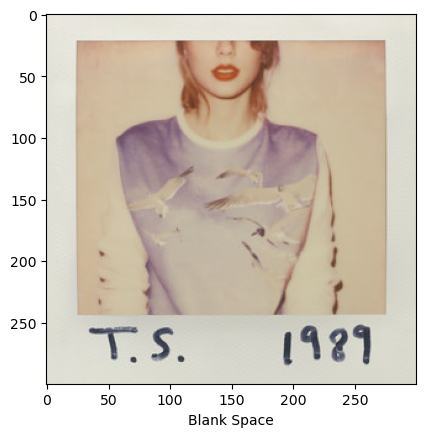

In [124]:
import matplotlib.pyplot as plt
from skimage import io

nome_musica = 'Taylor Swift - Blank Space'

id = projetion_kmeans\
          .filter(projetion_kmeans.artists_song == nome_musica)\
          .select('id').collect()[0][0]

track = sp.track(id)

url = track["album"]["images"][1]["url"]
name = track["name"]

image = io.imread(url)
plt.imshow(image)
plt.xlabel(name, fontsize = 10)
plt.show()


In [125]:
import matplotlib.pyplot as plt
from skimage import io

def visualize_songs(name,url):

  plt.figure(figsize=(15,10))
  columns = 5
  for i, u in enumerate(url):
      ax = plt.subplot(len(url) // columns + 1, columns, i + 1)
      image = io.imread(u)
      plt.imshow(image)
      ax.get_yaxis().set_visible(False)
      plt.xticks(color = 'w', fontsize = 0.1)
      plt.yticks(color = 'w', fontsize = 0.1)
      plt.xlabel(name[i], fontsize = 10)
      plt.tight_layout(h_pad=0.7, w_pad=0)
      plt.subplots_adjust(wspace=None, hspace=None)
      plt.grid(visible=None)
      #plt.axis('off')
  plt.show()

In [126]:
playlist_id = recomendadas.select('id').collect()

name = []
url = []
for i in playlist_id:
    track = sp.track(i[0])
    url.append(track["album"]["images"][1]["url"])
    name.append(track["name"])

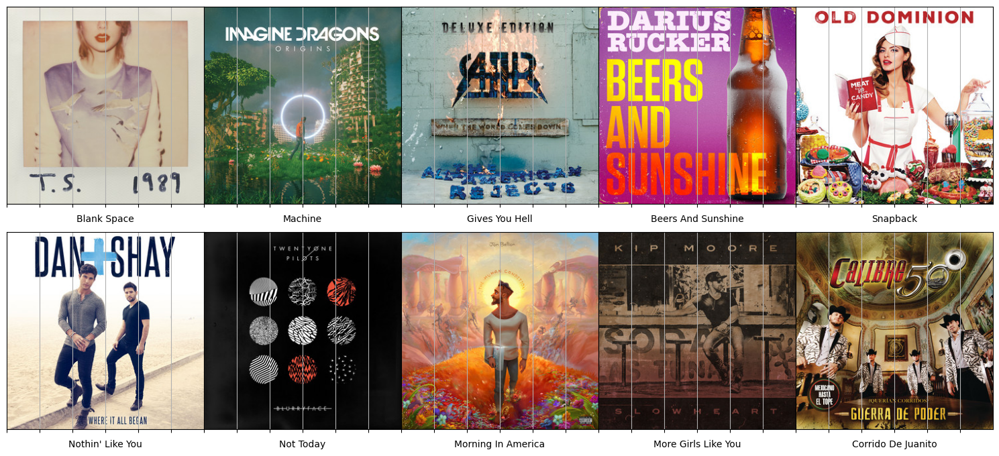

In [127]:
visualize_songs(name, url)

In [253]:
from pyspark.sql.functions import rand

In [256]:
def recomenda_musica(nome):
    #Calcula musicas recomendadas    
    musica_relacionadas = projetion_kmeans.select('artists_song').where(col('artists_song')\
                                                                 .like("%" + nome + "%"))\
                                                                 .orderBy(rand())\
                                                                 .limit(5)\
                                                                 .collect()
    musica_lista = []
    for musica in musica_relacionadas:
        musica_lista.append(musica[0])
    
    
    if projetion_kmeans.filter(projetion_kmeans.artists_song == nome).count() == 0:
        return print(f'''Artista/Música Relacionadas: \n{musica_lista}''')
       
    cluster = projetion_kmeans.filter(projetion_kmeans.artists_song == nome)\
                              .select('cluster_pca').collect()[0][0]

    musicas_recomendadas = projetion_kmeans.filter(projetion_kmeans.cluster_pca == cluster)\
                                           .select('artists_song', 'id', 'pca_features')

    componentes_musica = musicas_recomendadas.filter(musicas_recomendadas.artists_song == nome)\
                                             .select('pca_features')\
                                             .collect()[0][0]
    def calcula_distance(value):
        return euclidean(componentes_musica, value)

    udf_calcula_distace = f.udf(calcula_distance, FloatType())

    musicas_recomendadas_dist = musicas_recomendadas.withColumn('Dist', udf_calcula_distace('pca_features'))

    recomendadas = spark.createDataFrame(musicas_recomendadas_dist.sort('Dist').take(10))\
                        .select(['artists_song', 'id', 'Dist'])

    #Pegar informações da API
    playlist_id = recomendadas.select('id').collect()
    
    name = []
    url = []
    for i in playlist_id:
        track = sp.track(i[0])
        url.append(track["album"]["images"][1]["url"])
        name.append(track["name"])
        
    #Plotando Capas
    plt.figure(figsize=(15,10))
    columns = 5
    for i, u in enumerate(url):
        ax = plt.subplot(len(url) // columns + 1, columns, i + 1)
        image = io.imread(u)
        plt.imshow(image)
        ax.get_yaxis().set_visible(False)
        ax.get_xaxis().set_visible(True)
        plt.xticks(color = 'w', fontsize = 0.1)
        plt.yticks(color = 'w', fontsize = 0.1)
        plt.text(0.5, -0.1, name[i], fontsize=15, ha='center', transform=ax.transAxes)
        plt.tight_layout(h_pad=0.7, w_pad=0)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.grid(visible=None)
        #plt.axis('off')
    plt.show()

In [259]:
recomenda_musica('Travis')

Artista/Música Relacionadas: 
['Travis Scott - Wasted (feat. Juicy J)', 'Travis Scott - Upper Echelon (feat. T.I. & 2 Chainz)', 'Travis Scott - Oh My Dis Side (feat. Quavo)', 'Young Thug - The London (feat. J. Cole & Travis Scott)', 'Trippie Redd - Dark Knight Dummo (Feat. Travis Scott)']
